# Principal Component Analysis for Linear Dimensionality Reduction & Multi-class classification Using PathMNIST dataset

The number of features or variables used in a dataset is also known as the dimensionality. Often, using large number of features in the prediction can lead to complex or noisy models and introduction of unnecessary features. The process of dimensionality reduction helps in reducing the number of input features in the model, and to mitigate overfitting. Principal Component Analysis (or PCA) is one such technique for reducing dimensionality or number of features.

In this exercise, we will cover an example using PathMNIST dataset (from MedMNIST (https://medmnist.com/) and use PCA to conduct dimensionality reduction. 

As a next step, we will also train a multi-class classification model (where the output comprises of more than two classes, as would be the case for binary classification problems).

1. First, let's install medmnist, which would give us access to the code, data and libraries created by the developers of the mednist package, to allow data science enthusiasts to develop insights, and produce predictive models.

In [ ]:
!pip install medmnist

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%matplotlib inline
import IPython.core.display
IPython.core.display.set_matplotlib_formats("svg")
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
from sklearn import *
import os
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torchvision.transforms as transforms

import medmnist
from medmnist import INFO, Evaluator

In [ ]:
data_flag = 'pathmnist'
download = True

NUM_EPOCHS = 3
BATCH_SIZE = 128
lr = 0.001

info = INFO[data_flag]
task = info['task']
n_channels = info['n_channels']
n_classes = len(info['label'])

DataClass = getattr(medmnist, info['python_class'])

In [ ]:
# preprocessing
data_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[.5], std=[.5])
])

# load the data
train_dataset = DataClass(split='train', transform=data_transform, download=download)
test_dataset = DataClass(split='test', transform=data_transform, download=download)

pil_dataset = DataClass(split='train', download=download)

# encapsulate data into dataloader form
train_loader = data.DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True)
train_loader_at_eval = data.DataLoader(dataset=train_dataset, batch_size=2*BATCH_SIZE, shuffle=False)
test_loader = data.DataLoader(dataset=test_dataset, batch_size=2*BATCH_SIZE, shuffle=False)

Using downloaded and verified file: /root/.medmnist/pathmnist.npz
Using downloaded and verified file: /root/.medmnist/pathmnist.npz
Using downloaded and verified file: /root/.medmnist/pathmnist.npz


In [ ]:
print(train_dataset)
print("===================")
print(test_dataset)

Dataset PathMNIST (pathmnist)
    Number of datapoints: 89996
    Root location: /root/.medmnist
    Split: train
    Task: multi-class
    Number of channels: 3
    Meaning of labels: {'0': 'adipose', '1': 'background', '2': 'debris', '3': 'lymphocytes', '4': 'mucus', '5': 'smooth muscle', '6': 'normal colon mucosa', '7': 'cancer-associated stroma', '8': 'colorectal adenocarcinoma epithelium'}
    Number of samples: {'train': 89996, 'val': 10004, 'test': 7180}
    Description: The PathMNIST is based on a prior study for predicting survival from colorectal cancer histology slides, providing a dataset (NCT-CRC-HE-100K) of 100,000 non-overlapping image patches from hematoxylin & eosin stained histological images, and a test dataset (CRC-VAL-HE-7K) of 7,180 image patches from a different clinical center. The dataset is comprised of 9 types of tissues, resulting in a multi-class classification task. We resize the source images of 3×224×224 into 3×28×28, and split NCT-CRC-HE-100K into train

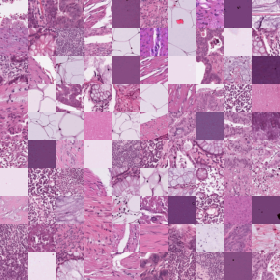

In [ ]:
# visualization through .montage

train_dataset.montage(length=10)

In [ ]:
print(type(train_dataset))
print(type(train_dataset.imgs))
print(train_dataset.imgs.shape)

<class 'medmnist.dataset.PathMNIST'>
<class 'numpy.ndarray'>
(89996, 28, 28, 3)


In [ ]:
print(train_dataset.imgs[1].shape)

(28, 28, 3)


In [ ]:
np.where(np.any(np.logical_or(train_dataset.labels == 0, train_dataset.labels == 1, train_dataset.labels == 2), axis=1))

(array([    0,    14,    15, ..., 89985, 89991, 89994]),)

In [ ]:
train_dataset.imgs[[14]]

array([[[[237, 221, 236],
         [237, 221, 236],
         [237, 222, 237],
         ...,
         [237, 220, 235],
         [237, 221, 236],
         [237, 221, 235]],

        [[237, 221, 236],
         [237, 221, 236],
         [237, 221, 236],
         ...,
         [237, 221, 235],
         [237, 221, 236],
         [237, 221, 236]],

        [[236, 221, 237],
         [237, 221, 236],
         [236, 219, 235],
         ...,
         [237, 220, 235],
         [237, 221, 236],
         [237, 221, 236]],

        ...,

        [[237, 221, 236],
         [237, 221, 236],
         [237, 221, 236],
         ...,
         [237, 220, 235],
         [237, 221, 236],
         [237, 221, 236]],

        [[236, 219, 232],
         [237, 222, 236],
         [237, 221, 236],
         ...,
         [237, 220, 235],
         [237, 221, 235],
         [237, 221, 236]],

        [[235, 212, 225],
         [237, 221, 236],
         [237, 221, 236],
         ...,
         [237, 221, 236],
        

In [ ]:
train_images_1 = train_dataset.imgs
test_images_1 = test_dataset.imgs

train_labels_1 = train_dataset.labels
test_labels_1 = test_dataset.labels

In [ ]:
train_images_1

array([[[[220, 208, 227],
         [219, 207, 227],
         [220, 207, 227],
         ...,
         [220, 208, 227],
         [219, 207, 227],
         [221, 208, 227]],

        [[218, 206, 226],
         [220, 207, 226],
         [219, 206, 226],
         ...,
         [197, 177, 202],
         [192, 172, 197],
         [190, 168, 195]],

        [[220, 208, 226],
         [220, 207, 226],
         [219, 205, 225],
         ...,
         [208, 191, 213],
         [207, 192, 213],
         [209, 194, 216]],

        ...,

        [[218, 205, 225],
         [217, 201, 222],
         [221, 208, 227],
         ...,
         [221, 208, 227],
         [220, 208, 227],
         [221, 209, 227]],

        [[213, 192, 218],
         [217, 200, 222],
         [221, 208, 227],
         ...,
         [221, 208, 227],
         [221, 209, 227],
         [221, 208, 227]],

        [[215, 195, 220],
         [220, 207, 226],
         [221, 208, 227],
         ...,
         [220, 208, 227],
        

In [ ]:
train_labels_1[train_labels_1 == 0] = int(0)
train_labels_1[train_labels_1 == 1] = int(1)
train_labels_1[train_labels_1 == 2] = int(2)
train_labels_1[train_labels_1 == 3] = int(3)
train_labels_1[train_labels_1 == 4] = int(4)
train_labels_1[train_labels_1 == 5] = int(5)
train_labels_1[train_labels_1 == 6] = int(6)
train_labels_1[train_labels_1 == 7] = int(7)
train_labels_1[train_labels_1 == 8] = int(8)

test_labels_1[test_labels_1 == 0] = int(0)
test_labels_1[test_labels_1 == 1] = int(1)
test_labels_1[test_labels_1 == 2] = int(2)
test_labels_1[test_labels_1 == 3] = int(3)
test_labels_1[test_labels_1 == 4] = int(4)
test_labels_1[test_labels_1 == 5] = int(5)
test_labels_1[test_labels_1 == 6] = int(6)
test_labels_1[test_labels_1 == 7] = int(7)
test_labels_1[test_labels_1 == 8] = int(8)

In [ ]:
# Flatten the dataset
nsamples, nx, ny, nz = train_images_1.shape
train_images_1_reshaped = train_images_1.reshape((nsamples,nx*ny*nz))

In [ ]:
# Flatten the dataset for the testing dataset
nsamples, nx, ny, nz = test_images_1.shape
test_images_1_reshaped = test_images_1.reshape((nsamples,nx*ny*nz))

In [ ]:
test_images_1_reshaped

array([[190, 114, 165, ..., 144,  78, 137],
       [200, 159, 199, ..., 156, 113, 166],
       [238, 230, 238, ..., 156, 112, 160],
       ...,
       [173, 131, 180, ..., 170, 124, 176],
       [132,  64, 123, ..., 155,  85, 142],
       [145,  82, 142, ..., 163,  98, 155]], dtype=uint8)

In [ ]:
# standardize the data since PCA is highly sensitive to the scale
scaler = preprocessing.StandardScaler()

scaler.fit_transform(train_images_1_reshaped)

trainX = scaler.transform(train_images_1_reshaped)
testX = scaler.transform(test_images_1_reshaped)

In [ ]:
print(trainX.shape)
print(testX.shape)

(89996, 2352)
(7180, 2352)


In [ ]:
# apply the PCA
pca = decomposition.PCA(n_components = 2)

# fit the training set
proj = pca.fit_transform(trainX)

plt.scatter(proj[:, 0], proj[:, 1], c=list(map(int, train_labels_1)), cmap=plt.cm.jet, s=20)
plt.colorbar()

In [ ]:
# calculate the percentage of explained variance
sum(pca.explained_variance_ratio_)

0.5702646350065564

In [ ]:
# apply the PCA 
# the parameter we insert is 0.9
# this means that we select the number of components such that 
# the amount of variance that needs to be explained is greater than the percentage specified by n_components.
pca = decomposition.PCA(0.9)

# fit the training set 
trainX_90 = pca.fit_transform(trainX)

In [ ]:
pca.n_components_

185

In [ ]:
compressed_image = pca.inverse_transform(trainX_90)

In [ ]:
compressed_image.shape

(89996, 2352)

In [ ]:
trainX[6].shape

(2352,)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, '90% of explained variance')

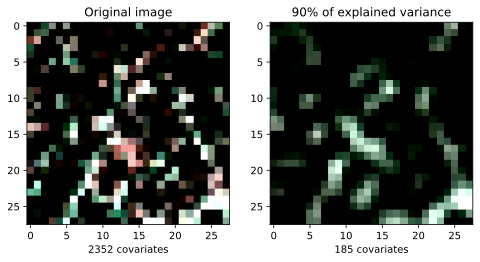

In [ ]:
compressed_image = pca.inverse_transform(trainX_90)

plt.figure(figsize=(8, 4))

# original image
plt.subplot(1, 2, 1)
plt.imshow(trainX[6].reshape(28, 28, 3), cmap=plt.cm.gray,interpolation='nearest')
plt.xlabel('2352 covariates')
plt.title('Original image')

# compressed image
plt.subplot(1, 2, 2)
plt.imshow(compressed_image[6].reshape(28, 28, 3), cmap=plt.cm.gray, interpolation='nearest')
plt.xlabel('185 covariates')
plt.title('90% of explained variance')

Label: [0]
The actual image:


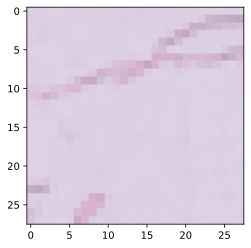

In [ ]:
plt.ion()
print('Label: ' + str(train_labels_1[0]))
print('The actual image:')
plt.imshow(train_images_1[0])
plt.show()

Label: [6]
The actual image:


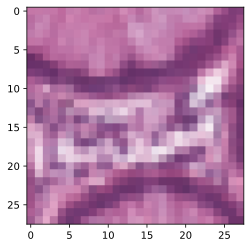

In [ ]:
plt.ion()
print('Label: ' + str(train_labels_1[100]))
print('The actual image:')
plt.imshow(train_images_1[100])
plt.show()

In [ ]:
train_images_1.shape

(89996, 28, 28, 3)

In [ ]:
# Flatten the dataset
nsamples, nx, ny, nz = train_images_1.shape
train_images_1_reshaped = train_images_1.reshape((nsamples,nx*ny*nz))

In [ ]:
# Flatten the dataset for the testing dataset
nsamples, nx, ny, nz = test_images_1.shape
test_images_1_reshaped = test_images_1.reshape((nsamples,nx*ny*nz))

In [ ]:
train_images_1_3 = train_dataset.imgs[[i for i, x in enumerate(np.logical_or(train_dataset.labels == 0, train_dataset.labels == 1, train_dataset.labels == 2)) if x]]
test_images_1_3 = test_dataset.imgs[[i for i, x in enumerate(np.logical_or(test_dataset.labels == 0, test_dataset.labels == 1, test_dataset.labels == 2)) if x]]

train_labels_1_3 = train_dataset.labels[[i for i, x in enumerate(np.logical_or(train_dataset.labels == 0, train_dataset.labels == 1, train_dataset.labels == 2)) if x]]
test_labels_1_3 = test_dataset.labels[[i for i, x in enumerate(np.logical_or(test_dataset.labels == 0, test_dataset.labels == 1, test_dataset.labels == 2)) if x]]

In [ ]:
train_labels_1_3[train_labels_1_3 == 0] = int(0)
train_labels_1_3[train_labels_1_3 == 1] = int(1)
train_labels_1_3[train_labels_1_3 == 2] = int(2)

test_labels_1_3[test_labels_1_3 == 0] = int(0)
test_labels_1_3[test_labels_1_3 == 1] = int(1)
test_labels_1_3[test_labels_1_3 == 2] = int(2)

In [ ]:
# Flatten the dataset
nsamples, nx, ny, nz = train_images_1_3.shape
train_images_1_3_reshaped = train_images_1_3.reshape((nsamples,nx*ny*nz))

In [ ]:
# Flatten the dataset for the testing dataset
nsamples, nx, ny, nz = test_images_1_3.shape
test_images_1_3_reshaped = test_images_1_3.reshape((nsamples,nx*ny*nz))

In [ ]:
# standardize the data since PCA is highly sensitive to the scale
scaler = preprocessing.StandardScaler()

scaler.fit_transform(train_images_1_3_reshaped)

trainX = scaler.transform(train_images_1_3_reshaped)
testX = scaler.transform(test_images_1_3_reshaped)

In [ ]:
import time 

start = time.time()
logreg = linear_model.LogisticRegression(solver = 'lbfgs', max_iter = 10)
logreg.fit(trainX, train_labels_1_3)
stop = time.time()

print("training time  =", stop - start)

# predict from the model
predYtest  = logreg.predict(testX)

# calculate accuracy for testing set
acc      = metrics.accuracy_score(test_labels_1_3, predYtest)
print("test accuracy  =", acc)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


training time  = 1.4330265522003174
test accuracy  = 0.9688787185354691


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
